In [8]:
!pip install 'zarr<3'
!pip install timm
!pip install openslide-python tiffslide
!pip install pyarrow

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.3.1 -> 25.3
[notice] To update, run: pip install --upgrade pip
Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.3.1 -> 25.3
[notice] To update, run: pip install --upgrade pip
Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.3.1 -> 25.3
[notice] To update, run: pip install --upgrade pip
Defaulting to user installation because normal site-packages is not writeable
  Using cached pyarrow-23.0.0-cp311-cp311-manylinux_2_28_x86_64.whl.metadata (3.0 kB)
Using cached pyarrow-23.0.0-cp311-cp311-manylinux_2_28_x86_64.whl (47.5 MB)

[notice] A new release of pip is available: 23.3.1 -> 25.3
[notice] To update, run: pip install --upgrade pip


In [22]:
# ALWAYS RUN THIS FIRST!
import os
import sys
from pathlib import Path

NOTEBOOK_DIR = Path("/rsrch9/home/plm/idso_fa1_pathology/codes/yshokrollahi/vitamin-p-latest")
os.chdir(NOTEBOOK_DIR)
sys.path.insert(0, str(NOTEBOOK_DIR))

print(f"✅ Working directory: {os.getcwd()}")


✅ Working directory: /rsrch9/home/plm/idso_fa1_pathology/codes/yshokrollahi/vitamin-p-latest


Loading experiment metadata...
Pixel size: 0.2125 microns/pixel

Loading cells metadata...
Cell coordinate columns: ['cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method']

Cell X range: 26.63 - 11511.13
Cell Y range: 22.95 - 23823.94

Loading nucleus boundaries...
Nucleus boundary columns: ['cell_id', 'vertex_x', 'vertex_y', 'label_id']

Nucleus X range: 24.44 - 11512.61
Nucleus Y range: 20.19 - 23825.29

--- Converting micron to pixel coordinates ---
Nucleus X (pixels): 115 - 54177
Nucleus Y (pixels): 95 - 112119

Center of cell mass (pixels): X=27757, Y=63955

Using region (pixels): X=27501 to 28013, Y=63699 to 64211

Opening morphology image with zarr...
Image shape: (12, 112134, 54229), dtype: uint16
Image dimensions: Height=112134, Width=54229
Final region 

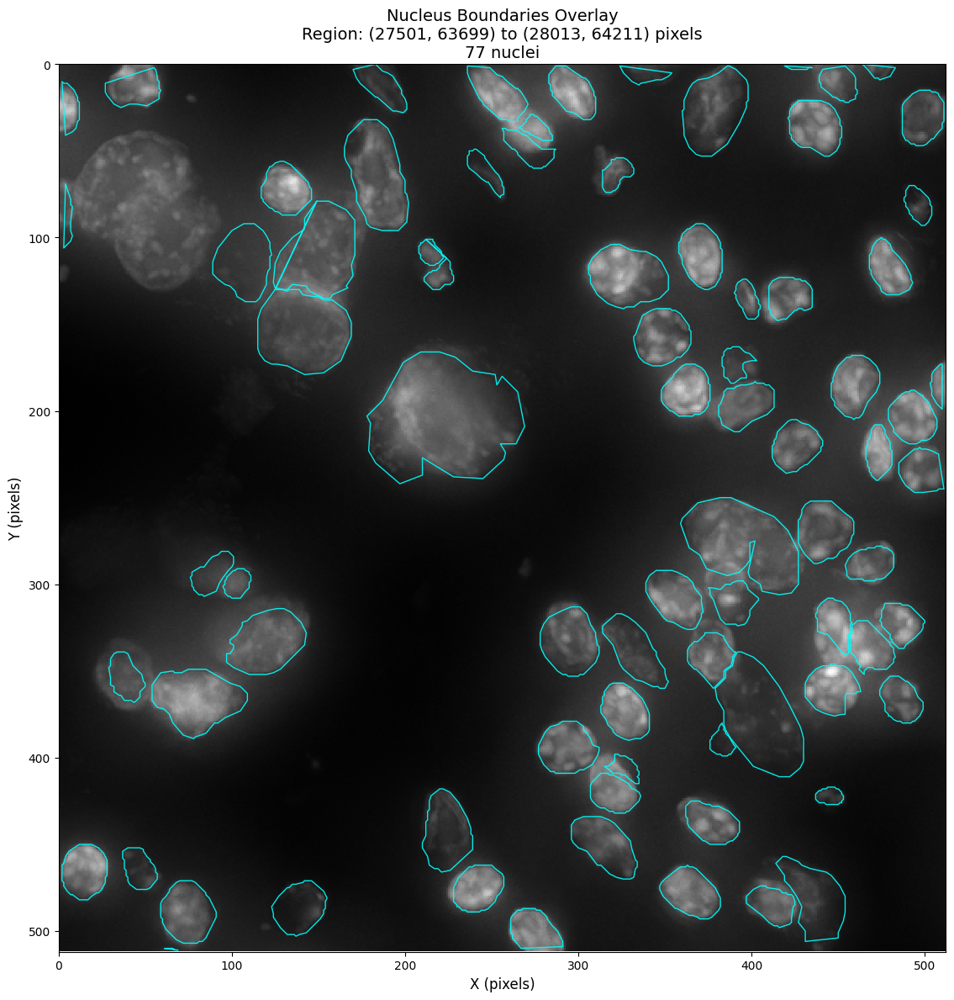


Visualization saved as 'nucleus_overlay_aligned.png'


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import tifffile
import zarr
import json
from pathlib import Path

# Set your data path
data_dir = "/rsrch9/home/plm/idso_fa1_pathology/TIER1/paul-xenium/Lung_Anthracosis/output-XETG00522__0057986__Region_1__20251203__234028"

# Load experiment metadata to get pixel size
print("Loading experiment metadata...")
with open(f"{data_dir}/experiment.xenium", 'r') as f:
    experiment = json.load(f)

# Get pixel size (microns per pixel)
pixel_size = experiment.get('pixel_size', 0.2125)  # Default Xenium pixel size
print(f"Pixel size: {pixel_size} microns/pixel")

# Load cells to check coordinate system
print("\nLoading cells metadata...")
cells = pd.read_parquet(f"{data_dir}/cells.parquet")
print(f"Cell coordinate columns: {cells.columns.tolist()}")
print(f"\nCell X range: {cells['x_centroid'].min():.2f} - {cells['x_centroid'].max():.2f}")
print(f"Cell Y range: {cells['y_centroid'].min():.2f} - {cells['y_centroid'].max():.2f}")

# Load nucleus boundaries
print("\nLoading nucleus boundaries...")
nucleus_boundaries = pd.read_parquet(f"{data_dir}/nucleus_boundaries.parquet")
print(f"Nucleus boundary columns: {nucleus_boundaries.columns.tolist()}")
print(f"\nNucleus X range: {nucleus_boundaries['vertex_x'].min():.2f} - {nucleus_boundaries['vertex_x'].max():.2f}")
print(f"Nucleus Y range: {nucleus_boundaries['vertex_y'].min():.2f} - {nucleus_boundaries['vertex_y'].max():.2f}")

# Convert micron coordinates to pixel coordinates
print("\n--- Converting micron to pixel coordinates ---")
nucleus_boundaries['vertex_x_pixels'] = nucleus_boundaries['vertex_x'] / pixel_size
nucleus_boundaries['vertex_y_pixels'] = nucleus_boundaries['vertex_y'] / pixel_size

print(f"Nucleus X (pixels): {nucleus_boundaries['vertex_x_pixels'].min():.0f} - {nucleus_boundaries['vertex_x_pixels'].max():.0f}")
print(f"Nucleus Y (pixels): {nucleus_boundaries['vertex_y_pixels'].min():.0f} - {nucleus_boundaries['vertex_y_pixels'].max():.0f}")

# Find center of mass in pixel coordinates
center_x_pixels = nucleus_boundaries['vertex_x_pixels'].median()
center_y_pixels = nucleus_boundaries['vertex_y_pixels'].median()
print(f"\nCenter of cell mass (pixels): X={center_x_pixels:.0f}, Y={center_y_pixels:.0f}")

# Parameters for the chunk
chunk_size = 512
start_x = int(center_x_pixels - chunk_size // 2)
start_y = int(center_y_pixels - chunk_size // 2)

print(f"\nUsing region (pixels): X={start_x} to {start_x+chunk_size}, Y={start_y} to {start_y+chunk_size}")

# Load morphology image with zarr
print("\nOpening morphology image with zarr...")
morphology_path = f"{data_dir}/morphology.ome.tif"

with tifffile.TiffFile(morphology_path) as tif:
    store = tif.series[0].aszarr()
    img_zarr = zarr.open(store, mode='r')
    img_array = img_zarr['0']
    
    print(f"Image shape: {img_array.shape}, dtype: {img_array.dtype}")
    
    if len(img_array.shape) == 3 and img_array.shape[0] < 20:
        n_channels, height, width = img_array.shape
    else:
        height, width = img_array.shape[:2]
    
    print(f"Image dimensions: Height={height}, Width={width}")
    
    # Validate coordinates
    start_x = max(0, min(start_x, width - chunk_size))
    start_y = max(0, min(start_y, height - chunk_size))
    
    print(f"Final region (pixels): X={start_x} to {start_x+chunk_size}, Y={start_y} to {start_y+chunk_size}")
    
    # Read chunk
    if len(img_array.shape) == 3 and img_array.shape[0] < 20:
        img_chunk = img_array[:, start_y:start_y+chunk_size, start_x:start_x+chunk_size]
        img_chunk = np.max(img_chunk, axis=0)
    elif len(img_array.shape) == 3:
        img_chunk = img_array[start_y:start_y+chunk_size, start_x:start_x+chunk_size, :]
        img_chunk = np.max(img_chunk, axis=2)
    else:
        img_chunk = img_array[start_y:start_y+chunk_size, start_x:start_x+chunk_size]

# Normalize image
img_chunk = np.asarray(img_chunk)
if img_chunk.size > 0:
    img_chunk = (img_chunk - img_chunk.min()) / (img_chunk.max() - img_chunk.min() + 1e-8)

# Filter boundaries within the chunk (using pixel coordinates)
nucleus_boundaries_chunk = nucleus_boundaries[
    (nucleus_boundaries['vertex_x_pixels'] >= start_x) & 
    (nucleus_boundaries['vertex_x_pixels'] < start_x + chunk_size) &
    (nucleus_boundaries['vertex_y_pixels'] >= start_y) & 
    (nucleus_boundaries['vertex_y_pixels'] < start_y + chunk_size)
].copy()

# Adjust coordinates to chunk-local coordinates
nucleus_boundaries_chunk['vertex_x_local'] = nucleus_boundaries_chunk['vertex_x_pixels'] - start_x
nucleus_boundaries_chunk['vertex_y_local'] = nucleus_boundaries_chunk['vertex_y_pixels'] - start_y

print(f"\nFound {nucleus_boundaries_chunk['cell_id'].nunique()} nuclei in this region")

# Create visualization
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# Display image
ax.imshow(img_chunk, cmap='gray', interpolation='nearest')

# Overlay nucleus boundaries
if len(nucleus_boundaries_chunk) > 0:
    patches = []
    for cell_id in nucleus_boundaries_chunk['cell_id'].unique():
        cell_boundary = nucleus_boundaries_chunk[nucleus_boundaries_chunk['cell_id'] == cell_id]
        vertices = cell_boundary[['vertex_x_local', 'vertex_y_local']].values
        polygon = Polygon(vertices, closed=True)
        patches.append(polygon)
    
    p = PatchCollection(patches, facecolors='none', edgecolors='cyan', linewidths=1.0, alpha=0.9)
    ax.add_collection(p)
    print(f"Drew {len(patches)} nuclei boundaries")
else:
    print("Warning: No nuclei found in this region")

ax.set_xlim(0, chunk_size)
ax.set_ylim(chunk_size, 0)
ax.set_title(f'Nucleus Boundaries Overlay\nRegion: ({start_x}, {start_y}) to ({start_x+chunk_size}, {start_y+chunk_size}) pixels\n{nucleus_boundaries_chunk["cell_id"].nunique()} nuclei', 
             fontsize=14)
ax.set_xlabel('X (pixels)', fontsize=12)
ax.set_ylabel('Y (pixels)', fontsize=12)

plt.tight_layout()
plt.savefig('nucleus_overlay_aligned.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nVisualization saved as 'nucleus_overlay_aligned.png'")

Loading experiment metadata...
Pixel size: 0.2125 microns/pixel

Region (pixels): X=27000 to 28024, Y=63500 to 64524

Loading morphology image...
Loading nucleus boundaries...
Found 417 nuclei
Loading cell boundaries...
Found 435 cells
Loading transcripts...
Found 199734 transcripts
Assigned to cells: 199734
Unassigned: 0

*** Transcript Assignment Efficiency: 100.00% ***


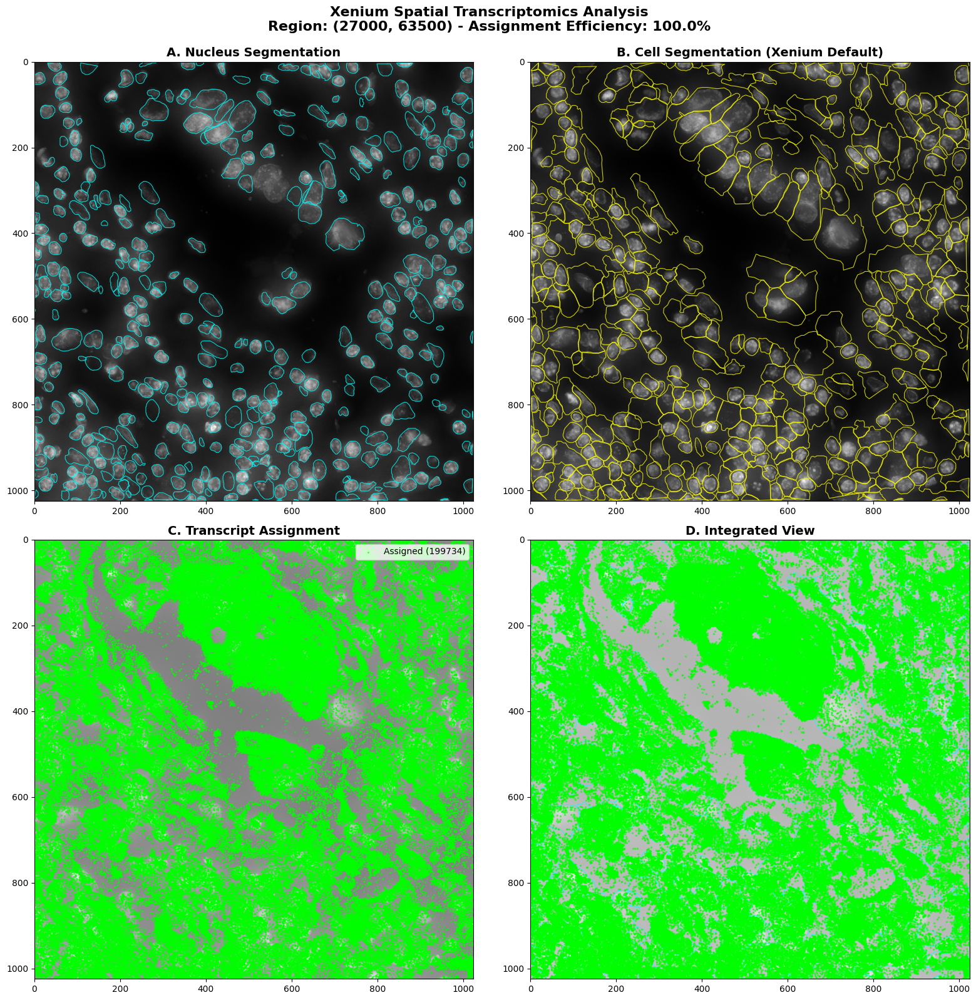


=== MANUSCRIPT METRICS ===
Transcript Assignment Efficiency: 100.00%
Total transcripts in region: 199734
Assigned transcripts: 199734
Unassigned transcripts: 0
Number of cells: 435
Number of nuclei: 417


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import tifffile
import zarr
import json
from pathlib import Path

# Set your data path
data_dir = "/rsrch9/home/plm/idso_fa1_pathology/TIER1/paul-xenium/Lung_Anthracosis/output-XETG00522__0057986__Region_1__20251203__234028"

# Load experiment metadata
print("Loading experiment metadata...")
with open(f"{data_dir}/experiment.xenium", 'r') as f:
    experiment = json.load(f)

pixel_size = experiment.get('pixel_size', 0.2125)
print(f"Pixel size: {pixel_size} microns/pixel")

# Parameters for the chunk
chunk_size = 1024  # Larger view for manuscript figure
start_x = 27000  # Adjust as needed
start_y = 63500

print(f"\nRegion (pixels): X={start_x} to {start_x+chunk_size}, Y={start_y} to {start_y+chunk_size}")

# Load morphology image
print("\nLoading morphology image...")
morphology_path = f"{data_dir}/morphology.ome.tif"

with tifffile.TiffFile(morphology_path) as tif:
    store = tif.series[0].aszarr()
    img_zarr = zarr.open(store, mode='r')
    img_array = img_zarr['0']
    
    if len(img_array.shape) == 3 and img_array.shape[0] < 20:
        img_chunk = img_array[:, start_y:start_y+chunk_size, start_x:start_x+chunk_size]
        img_chunk = np.max(img_chunk, axis=0)
    else:
        img_chunk = img_array[start_y:start_y+chunk_size, start_x:start_x+chunk_size]
        if len(img_chunk.shape) == 3:
            img_chunk = np.max(img_chunk, axis=2)

# Normalize image
img_chunk = np.asarray(img_chunk)
img_chunk = (img_chunk - img_chunk.min()) / (img_chunk.max() - img_chunk.min() + 1e-8)

# Load nucleus boundaries
print("Loading nucleus boundaries...")
nucleus_boundaries = pd.read_parquet(f"{data_dir}/nucleus_boundaries.parquet")
nucleus_boundaries['vertex_x_pixels'] = nucleus_boundaries['vertex_x'] / pixel_size
nucleus_boundaries['vertex_y_pixels'] = nucleus_boundaries['vertex_y'] / pixel_size

nucleus_boundaries_chunk = nucleus_boundaries[
    (nucleus_boundaries['vertex_x_pixels'] >= start_x) & 
    (nucleus_boundaries['vertex_x_pixels'] < start_x + chunk_size) &
    (nucleus_boundaries['vertex_y_pixels'] >= start_y) & 
    (nucleus_boundaries['vertex_y_pixels'] < start_y + chunk_size)
].copy()

nucleus_boundaries_chunk['vertex_x_local'] = nucleus_boundaries_chunk['vertex_x_pixels'] - start_x
nucleus_boundaries_chunk['vertex_y_local'] = nucleus_boundaries_chunk['vertex_y_pixels'] - start_y

print(f"Found {nucleus_boundaries_chunk['cell_id'].nunique()} nuclei")

# Load cell boundaries
print("Loading cell boundaries...")
cell_boundaries = pd.read_parquet(f"{data_dir}/cell_boundaries.parquet")
cell_boundaries['vertex_x_pixels'] = cell_boundaries['vertex_x'] / pixel_size
cell_boundaries['vertex_y_pixels'] = cell_boundaries['vertex_y'] / pixel_size

cell_boundaries_chunk = cell_boundaries[
    (cell_boundaries['vertex_x_pixels'] >= start_x) & 
    (cell_boundaries['vertex_x_pixels'] < start_x + chunk_size) &
    (cell_boundaries['vertex_y_pixels'] >= start_y) & 
    (cell_boundaries['vertex_y_pixels'] < start_y + chunk_size)
].copy()

cell_boundaries_chunk['vertex_x_local'] = cell_boundaries_chunk['vertex_x_pixels'] - start_x
cell_boundaries_chunk['vertex_y_local'] = cell_boundaries_chunk['vertex_y_pixels'] - start_y

print(f"Found {cell_boundaries_chunk['cell_id'].nunique()} cells")

# Load transcripts
print("Loading transcripts...")
transcripts = pd.read_parquet(f"{data_dir}/transcripts.parquet")

# Convert transcript coordinates to pixels
transcripts['x_pixels'] = transcripts['x_location'] / pixel_size
transcripts['y_pixels'] = transcripts['y_location'] / pixel_size

# Filter transcripts in the chunk
transcripts_chunk = transcripts[
    (transcripts['x_pixels'] >= start_x) & 
    (transcripts['x_pixels'] < start_x + chunk_size) &
    (transcripts['y_pixels'] >= start_y) & 
    (transcripts['y_pixels'] < start_y + chunk_size)
].copy()

transcripts_chunk['x_local'] = transcripts_chunk['x_pixels'] - start_x
transcripts_chunk['y_local'] = transcripts_chunk['y_pixels'] - start_y

print(f"Found {len(transcripts_chunk)} transcripts")
print(f"Assigned to cells: {transcripts_chunk['cell_id'].notna().sum()}")
print(f"Unassigned: {transcripts_chunk['cell_id'].isna().sum()}")

# Calculate assignment efficiency
assigned = transcripts_chunk['cell_id'].notna().sum()
total = len(transcripts_chunk)
assignment_efficiency = (assigned / total * 100) if total > 0 else 0
print(f"\n*** Transcript Assignment Efficiency: {assignment_efficiency:.2f}% ***")

# Create comprehensive figure
fig, axes = plt.subplots(2, 2, figsize=(16, 16))

# Panel A: Morphology with nucleus boundaries
ax = axes[0, 0]
ax.imshow(img_chunk, cmap='gray', interpolation='nearest')
if len(nucleus_boundaries_chunk) > 0:
    patches = []
    for cell_id in nucleus_boundaries_chunk['cell_id'].unique():
        cell_boundary = nucleus_boundaries_chunk[nucleus_boundaries_chunk['cell_id'] == cell_id]
        vertices = cell_boundary[['vertex_x_local', 'vertex_y_local']].values
        patches.append(Polygon(vertices, closed=True))
    p = PatchCollection(patches, facecolors='none', edgecolors='cyan', linewidths=0.8, alpha=0.8)
    ax.add_collection(p)
ax.set_title('A. Nucleus Segmentation', fontsize=14, fontweight='bold')
ax.set_xlim(0, chunk_size)
ax.set_ylim(chunk_size, 0)

# Panel B: Morphology with cell boundaries
ax = axes[0, 1]
ax.imshow(img_chunk, cmap='gray', interpolation='nearest')
if len(cell_boundaries_chunk) > 0:
    patches = []
    for cell_id in cell_boundaries_chunk['cell_id'].unique():
        cell_boundary = cell_boundaries_chunk[cell_boundaries_chunk['cell_id'] == cell_id]
        vertices = cell_boundary[['vertex_x_local', 'vertex_y_local']].values
        patches.append(Polygon(vertices, closed=True))
    p = PatchCollection(patches, facecolors='none', edgecolors='yellow', linewidths=0.8, alpha=0.8)
    ax.add_collection(p)
ax.set_title('B. Cell Segmentation (Xenium Default)', fontsize=14, fontweight='bold')
ax.set_xlim(0, chunk_size)
ax.set_ylim(chunk_size, 0)

# Panel C: Transcripts overlaid
ax = axes[1, 0]
ax.imshow(img_chunk, cmap='gray', interpolation='nearest', alpha=0.5)

# Plot assigned transcripts (green) and unassigned (red)
assigned_tx = transcripts_chunk[transcripts_chunk['cell_id'].notna()]
unassigned_tx = transcripts_chunk[transcripts_chunk['cell_id'].isna()]

if len(assigned_tx) > 0:
    ax.scatter(assigned_tx['x_local'], assigned_tx['y_local'], 
               c='lime', s=1, alpha=0.6, label=f'Assigned ({len(assigned_tx)})')
if len(unassigned_tx) > 0:
    ax.scatter(unassigned_tx['x_local'], unassigned_tx['y_local'], 
               c='red', s=1, alpha=0.6, label=f'Unassigned ({len(unassigned_tx)})')

ax.set_title('C. Transcript Assignment', fontsize=14, fontweight='bold')
ax.legend(loc='upper right', fontsize=10)
ax.set_xlim(0, chunk_size)
ax.set_ylim(chunk_size, 0)

# Panel D: Combined view with cell boundaries and transcripts
ax = axes[1, 1]
ax.imshow(img_chunk, cmap='gray', interpolation='nearest', alpha=0.3)

# Cell boundaries
if len(cell_boundaries_chunk) > 0:
    patches = []
    for cell_id in cell_boundaries_chunk['cell_id'].unique():
        cell_boundary = cell_boundaries_chunk[cell_boundaries_chunk['cell_id'] == cell_id]
        vertices = cell_boundary[['vertex_x_local', 'vertex_y_local']].values
        patches.append(Polygon(vertices, closed=True))
    p = PatchCollection(patches, facecolors='none', edgecolors='cyan', linewidths=0.8, alpha=0.7)
    ax.add_collection(p)

# Transcripts
if len(assigned_tx) > 0:
    ax.scatter(assigned_tx['x_local'], assigned_tx['y_local'], 
               c='lime', s=2, alpha=0.5)
if len(unassigned_tx) > 0:
    ax.scatter(unassigned_tx['x_local'], unassigned_tx['y_local'], 
               c='red', s=2, alpha=0.5)

ax.set_title('D. Integrated View', fontsize=14, fontweight='bold')
ax.set_xlim(0, chunk_size)
ax.set_ylim(chunk_size, 0)

# Overall title
fig.suptitle(f'Xenium Spatial Transcriptomics Analysis\n'
             f'Region: ({start_x}, {start_y}) - Assignment Efficiency: {assignment_efficiency:.1f}%',
             fontsize=16, fontweight='bold', y=0.995)

plt.tight_layout()
plt.savefig('xenium_manuscript_figure.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n=== MANUSCRIPT METRICS ===")
print(f"Transcript Assignment Efficiency: {assignment_efficiency:.2f}%")
print(f"Total transcripts in region: {total}")
print(f"Assigned transcripts: {assigned}")
print(f"Unassigned transcripts: {total - assigned}")
print(f"Number of cells: {cell_boundaries_chunk['cell_id'].nunique()}")
print(f"Number of nuclei: {nucleus_boundaries_chunk['cell_id'].nunique()}")

Loading experiment metadata...
Pixel size: 0.2125 microns/pixel

Region (pixels): X=27500 to 28012, Y=63700 to 64212

Loading morphology image...
Loading nucleus boundaries...
Found 77 nuclei
Loading cell boundaries...
Found 87 cells
Loading transcripts...
Found 52263 transcripts

Validating transcript assignments geometrically...

=== TRANSCRIPT ASSIGNMENT ANALYSIS ===
Total transcripts: 52263
Xenium assigned: 52263 (100.0%)
Geometrically inside cells: 39661 (75.9%)
Assigned but OUTSIDE cells (errors): 12602 (24.1%)


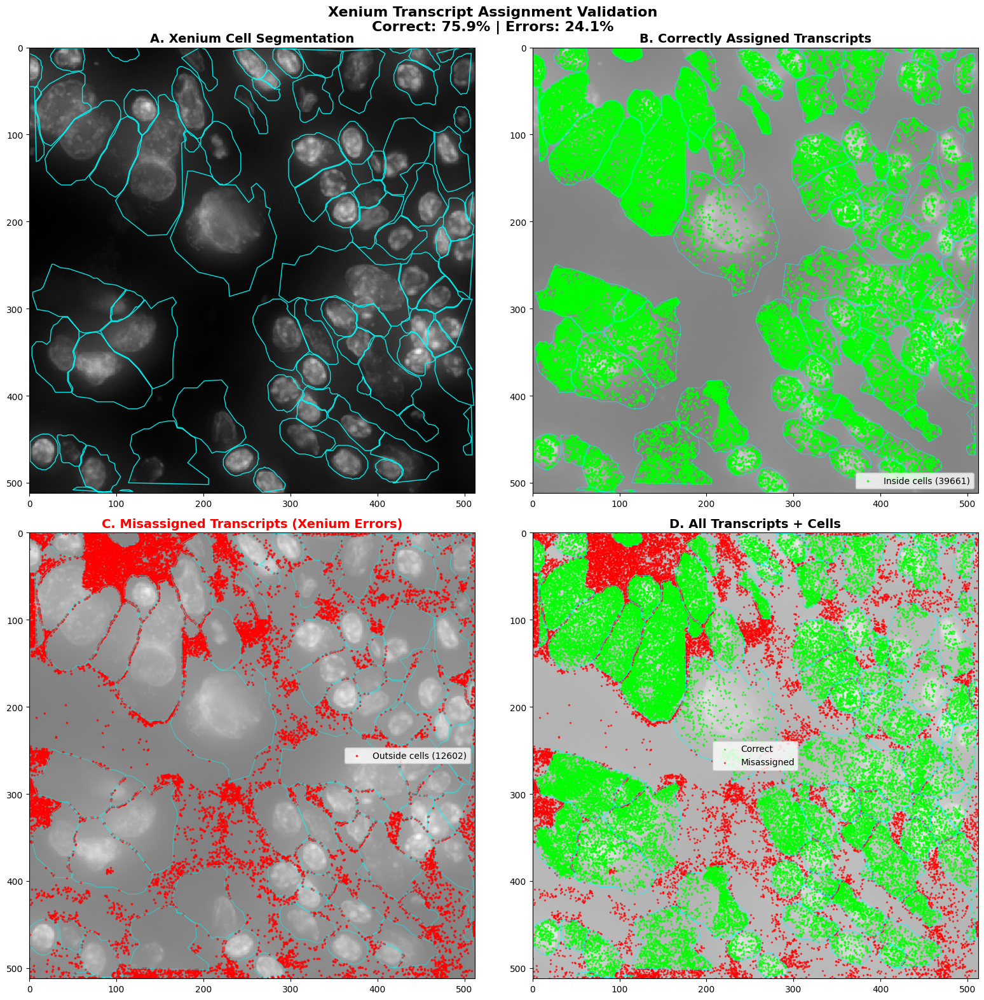


✅ Saved: xenium_assignment_validation.png


In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
from matplotlib.path import Path
import tifffile
import zarr
import json

# Set your data path
data_dir = "/rsrch9/home/plm/idso_fa1_pathology/TIER1/paul-xenium/Lung_Anthracosis/output-XETG00522__0057986__Region_1__20251203__234028"

# Load experiment metadata
print("Loading experiment metadata...")
with open(f"{data_dir}/experiment.xenium", 'r') as f:
    experiment = json.load(f)

pixel_size = experiment.get('pixel_size', 0.2125)
print(f"Pixel size: {pixel_size} microns/pixel")

# Parameters for the chunk - SMALLER FOR SPEED
chunk_size = 512
start_x = 27500
start_y = 63700

print(f"\nRegion (pixels): X={start_x} to {start_x+chunk_size}, Y={start_y} to {start_y+chunk_size}")

# Load morphology image
print("\nLoading morphology image...")
morphology_path = f"{data_dir}/morphology.ome.tif"

with tifffile.TiffFile(morphology_path) as tif:
    store = tif.series[0].aszarr()
    img_zarr = zarr.open(store, mode='r')
    img_array = img_zarr['0']
    
    if len(img_array.shape) == 3 and img_array.shape[0] < 20:
        img_chunk = img_array[:, start_y:start_y+chunk_size, start_x:start_x+chunk_size]
        img_chunk = np.max(img_chunk, axis=0)
    else:
        img_chunk = img_array[start_y:start_y+chunk_size, start_x:start_x+chunk_size]
        if len(img_chunk.shape) == 3:
            img_chunk = np.max(img_chunk, axis=2)

img_chunk = np.asarray(img_chunk)
img_chunk = (img_chunk - img_chunk.min()) / (img_chunk.max() - img_chunk.min() + 1e-8)

# Load nucleus boundaries
print("Loading nucleus boundaries...")
nucleus_boundaries = pd.read_parquet(f"{data_dir}/nucleus_boundaries.parquet")
nucleus_boundaries['vertex_x_pixels'] = nucleus_boundaries['vertex_x'] / pixel_size
nucleus_boundaries['vertex_y_pixels'] = nucleus_boundaries['vertex_y'] / pixel_size

nucleus_boundaries_chunk = nucleus_boundaries[
    (nucleus_boundaries['vertex_x_pixels'] >= start_x) & 
    (nucleus_boundaries['vertex_x_pixels'] < start_x + chunk_size) &
    (nucleus_boundaries['vertex_y_pixels'] >= start_y) & 
    (nucleus_boundaries['vertex_y_pixels'] < start_y + chunk_size)
].copy()

nucleus_boundaries_chunk['vertex_x_local'] = nucleus_boundaries_chunk['vertex_x_pixels'] - start_x
nucleus_boundaries_chunk['vertex_y_local'] = nucleus_boundaries_chunk['vertex_y_pixels'] - start_y

print(f"Found {nucleus_boundaries_chunk['cell_id'].nunique()} nuclei")

# Load cell boundaries
print("Loading cell boundaries...")
cell_boundaries = pd.read_parquet(f"{data_dir}/cell_boundaries.parquet")
cell_boundaries['vertex_x_pixels'] = cell_boundaries['vertex_x'] / pixel_size
cell_boundaries['vertex_y_pixels'] = cell_boundaries['vertex_y'] / pixel_size

cell_boundaries_chunk = cell_boundaries[
    (cell_boundaries['vertex_x_pixels'] >= start_x) & 
    (cell_boundaries['vertex_x_pixels'] < start_x + chunk_size) &
    (cell_boundaries['vertex_y_pixels'] >= start_y) & 
    (cell_boundaries['vertex_y_pixels'] < start_y + chunk_size)
].copy()

cell_boundaries_chunk['vertex_x_local'] = cell_boundaries_chunk['vertex_x_pixels'] - start_x
cell_boundaries_chunk['vertex_y_local'] = cell_boundaries_chunk['vertex_y_pixels'] - start_y

print(f"Found {cell_boundaries_chunk['cell_id'].nunique()} cells")

# Load transcripts
print("Loading transcripts...")
transcripts = pd.read_parquet(f"{data_dir}/transcripts.parquet")

# Convert transcript coordinates to pixels
transcripts['x_pixels'] = transcripts['x_location'] / pixel_size
transcripts['y_pixels'] = transcripts['y_location'] / pixel_size

# Filter transcripts in the chunk
transcripts_chunk = transcripts[
    (transcripts['x_pixels'] >= start_x) & 
    (transcripts['x_pixels'] < start_x + chunk_size) &
    (transcripts['y_pixels'] >= start_y) & 
    (transcripts['y_pixels'] < start_y + chunk_size)
].copy()

transcripts_chunk['x_local'] = transcripts_chunk['x_pixels'] - start_x
transcripts_chunk['y_local'] = transcripts_chunk['y_pixels'] - start_y

print(f"Found {len(transcripts_chunk)} transcripts")

# === GEOMETRIC VALIDATION: Check if transcripts are ACTUALLY inside cells ===
print("\nValidating transcript assignments geometrically...")

# Create cell polygon dictionary
cell_polygons = {}
for cell_id in cell_boundaries_chunk['cell_id'].unique():
    cell_boundary = cell_boundaries_chunk[cell_boundaries_chunk['cell_id'] == cell_id]
    vertices = cell_boundary[['vertex_x_local', 'vertex_y_local']].values
    if len(vertices) > 2:
        cell_polygons[cell_id] = Path(vertices)

# Check each transcript
transcripts_chunk['geometrically_assigned'] = False
for idx, tx in transcripts_chunk.iterrows():
    tx_point = (tx['x_local'], tx['y_local'])
    # Check if assigned cell_id matches geometric containment
    if pd.notna(tx['cell_id']) and tx['cell_id'] in cell_polygons:
        if cell_polygons[tx['cell_id']].contains_point(tx_point):
            transcripts_chunk.at[idx, 'geometrically_assigned'] = True

# Calculate metrics
xenium_assigned = transcripts_chunk['cell_id'].notna().sum()  # Xenium's assignment
geometrically_correct = transcripts_chunk['geometrically_assigned'].sum()  # Actually inside
geometrically_incorrect = xenium_assigned - geometrically_correct  # Assigned but outside!
total_transcripts = len(transcripts_chunk)

print(f"\n=== TRANSCRIPT ASSIGNMENT ANALYSIS ===")
print(f"Total transcripts: {total_transcripts}")
print(f"Xenium assigned: {xenium_assigned} ({xenium_assigned/total_transcripts*100:.1f}%)")
print(f"Geometrically inside cells: {geometrically_correct} ({geometrically_correct/total_transcripts*100:.1f}%)")
print(f"Assigned but OUTSIDE cells (errors): {geometrically_incorrect} ({geometrically_incorrect/total_transcripts*100:.1f}%)")

# Create visualization
fig, axes = plt.subplots(2, 2, figsize=(16, 16))

# Panel A: Morphology with cell boundaries
ax = axes[0, 0]
ax.imshow(img_chunk, cmap='gray', interpolation='nearest')
if len(cell_boundaries_chunk) > 0:
    patches = []
    for cell_id in cell_boundaries_chunk['cell_id'].unique():
        cell_boundary = cell_boundaries_chunk[cell_boundaries_chunk['cell_id'] == cell_id]
        vertices = cell_boundary[['vertex_x_local', 'vertex_y_local']].values
        patches.append(Polygon(vertices, closed=True))
    p = PatchCollection(patches, facecolors='none', edgecolors='cyan', linewidths=1.0, alpha=0.9)
    ax.add_collection(p)
ax.set_title('A. Xenium Cell Segmentation', fontsize=14, fontweight='bold')
ax.set_xlim(0, chunk_size)
ax.set_ylim(chunk_size, 0)

# Panel B: Correctly assigned transcripts (green)
ax = axes[0, 1]
ax.imshow(img_chunk, cmap='gray', interpolation='nearest', alpha=0.5)
correct_tx = transcripts_chunk[transcripts_chunk['geometrically_assigned']]
if len(correct_tx) > 0:
    ax.scatter(correct_tx['x_local'], correct_tx['y_local'], 
               c='lime', s=3, alpha=0.7, label=f'Inside cells ({len(correct_tx)})')
# Add cell boundaries
if len(cell_boundaries_chunk) > 0:
    patches = []
    for cell_id in cell_boundaries_chunk['cell_id'].unique():
        cell_boundary = cell_boundaries_chunk[cell_boundaries_chunk['cell_id'] == cell_id]
        vertices = cell_boundary[['vertex_x_local', 'vertex_y_local']].values
        patches.append(Polygon(vertices, closed=True))
    p = PatchCollection(patches, facecolors='none', edgecolors='cyan', linewidths=0.8, alpha=0.5)
    ax.add_collection(p)
ax.set_title('B. Correctly Assigned Transcripts', fontsize=14, fontweight='bold')
ax.legend()
ax.set_xlim(0, chunk_size)
ax.set_ylim(chunk_size, 0)

# Panel C: INCORRECTLY assigned transcripts (red)
ax = axes[1, 0]
ax.imshow(img_chunk, cmap='gray', interpolation='nearest', alpha=0.5)
incorrect_tx = transcripts_chunk[transcripts_chunk['cell_id'].notna() & ~transcripts_chunk['geometrically_assigned']]
if len(incorrect_tx) > 0:
    ax.scatter(incorrect_tx['x_local'], incorrect_tx['y_local'], 
               c='red', s=3, alpha=0.7, label=f'Outside cells ({len(incorrect_tx)})')
# Add cell boundaries
if len(cell_boundaries_chunk) > 0:
    patches = []
    for cell_id in cell_boundaries_chunk['cell_id'].unique():
        cell_boundary = cell_boundaries_chunk[cell_boundaries_chunk['cell_id'] == cell_id]
        vertices = cell_boundary[['vertex_x_local', 'vertex_y_local']].values
        patches.append(Polygon(vertices, closed=True))
    p = PatchCollection(patches, facecolors='none', edgecolors='cyan', linewidths=0.8, alpha=0.5)
    ax.add_collection(p)
ax.set_title('C. Misassigned Transcripts (Xenium Errors)', fontsize=14, fontweight='bold', color='red')
ax.legend()
ax.set_xlim(0, chunk_size)
ax.set_ylim(chunk_size, 0)

# Panel D: Combined view
ax = axes[1, 1]
ax.imshow(img_chunk, cmap='gray', interpolation='nearest', alpha=0.3)
if len(correct_tx) > 0:
    ax.scatter(correct_tx['x_local'], correct_tx['y_local'], 
               c='lime', s=2, alpha=0.6, label='Correct')
if len(incorrect_tx) > 0:
    ax.scatter(incorrect_tx['x_local'], incorrect_tx['y_local'], 
               c='red', s=2, alpha=0.6, label='Misassigned')
if len(cell_boundaries_chunk) > 0:
    patches = []
    for cell_id in cell_boundaries_chunk['cell_id'].unique():
        cell_boundary = cell_boundaries_chunk[cell_boundaries_chunk['cell_id'] == cell_id]
        vertices = cell_boundary[['vertex_x_local', 'vertex_y_local']].values
        patches.append(Polygon(vertices, closed=True))
    p = PatchCollection(patches, facecolors='none', edgecolors='cyan', linewidths=0.8, alpha=0.7)
    ax.add_collection(p)
ax.set_title('D. All Transcripts + Cells', fontsize=14, fontweight='bold')
ax.legend()
ax.set_xlim(0, chunk_size)
ax.set_ylim(chunk_size, 0)

plt.suptitle(f'Xenium Transcript Assignment Validation\n'
             f'Correct: {geometrically_correct/total_transcripts*100:.1f}% | '
             f'Errors: {geometrically_incorrect/total_transcripts*100:.1f}%',
             fontsize=16, fontweight='bold')

plt.tight_layout()
plt.savefig('xenium_assignment_validation.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✅ Saved: xenium_assignment_validation.png")

Loading experiment metadata...
Pixel size: 0.2125 microns/pixel

Region (pixels): X=27500 to 28012, Y=63700 to 64212

Loading morphology image...
Loading nucleus boundaries...
Found 77 nuclei
Loading cell boundaries...
Found 87 cells
Loading cell expression data...
Found 74 cells with expression data
Loading transcripts...
Found 52263 transcripts

Creating cell expression heatmap...

Validating transcript assignments geometrically...

=== TRANSCRIPT ASSIGNMENT ANALYSIS ===
Total transcripts: 52263
Xenium assigned: 52263 (100.0%)
Geometrically inside cells: 39661 (75.9%)
Assigned but OUTSIDE cells (errors): 12602 (24.1%)


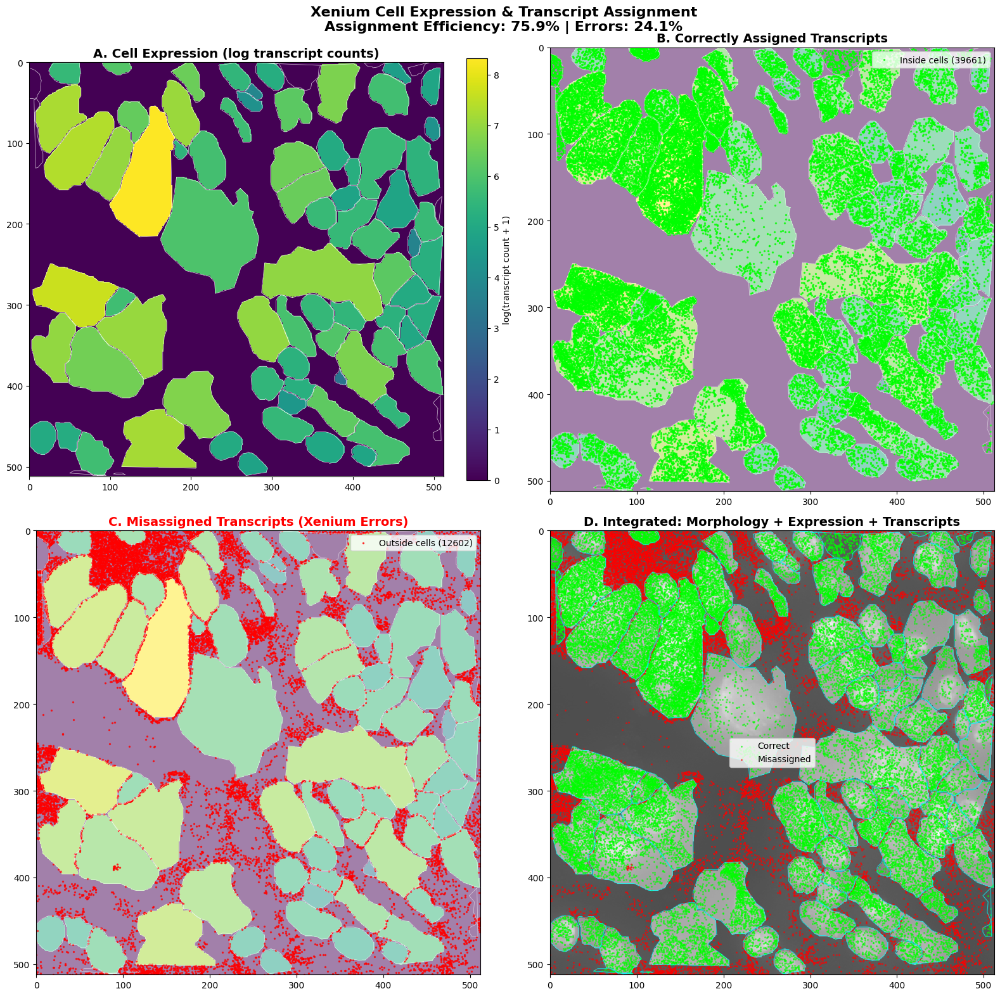


✅ Saved: xenium_expression_validation.png

Expression statistics:
  Mean transcripts/cell: 482.1
  Median transcripts/cell: 271.0
  Min transcripts/cell: 23
  Max transcripts/cell: 4107


In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
from matplotlib.path import Path
import tifffile
import zarr
import json

# Set your data path
data_dir = "/rsrch9/home/plm/idso_fa1_pathology/TIER1/paul-xenium/Lung_Anthracosis/output-XETG00522__0057986__Region_1__20251203__234028"

# Load experiment metadata
print("Loading experiment metadata...")
with open(f"{data_dir}/experiment.xenium", 'r') as f:
    experiment = json.load(f)

pixel_size = experiment.get('pixel_size', 0.2125)
print(f"Pixel size: {pixel_size} microns/pixel")

# Parameters for the chunk
chunk_size = 512
start_x = 27500
start_y = 63700

print(f"\nRegion (pixels): X={start_x} to {start_x+chunk_size}, Y={start_y} to {start_y+chunk_size}")

# Load morphology image
print("\nLoading morphology image...")
morphology_path = f"{data_dir}/morphology.ome.tif"

with tifffile.TiffFile(morphology_path) as tif:
    store = tif.series[0].aszarr()
    img_zarr = zarr.open(store, mode='r')
    img_array = img_zarr['0']
    
    if len(img_array.shape) == 3 and img_array.shape[0] < 20:
        img_chunk = img_array[:, start_y:start_y+chunk_size, start_x:start_x+chunk_size]
        img_chunk = np.max(img_chunk, axis=0)
    else:
        img_chunk = img_array[start_y:start_y+chunk_size, start_x:start_x+chunk_size]
        if len(img_chunk.shape) == 3:
            img_chunk = np.max(img_chunk, axis=2)

img_chunk = np.asarray(img_chunk)
img_chunk = (img_chunk - img_chunk.min()) / (img_chunk.max() - img_chunk.min() + 1e-8)

# Load nucleus boundaries
print("Loading nucleus boundaries...")
nucleus_boundaries = pd.read_parquet(f"{data_dir}/nucleus_boundaries.parquet")
nucleus_boundaries['vertex_x_pixels'] = nucleus_boundaries['vertex_x'] / pixel_size
nucleus_boundaries['vertex_y_pixels'] = nucleus_boundaries['vertex_y'] / pixel_size

nucleus_boundaries_chunk = nucleus_boundaries[
    (nucleus_boundaries['vertex_x_pixels'] >= start_x) & 
    (nucleus_boundaries['vertex_x_pixels'] < start_x + chunk_size) &
    (nucleus_boundaries['vertex_y_pixels'] >= start_y) & 
    (nucleus_boundaries['vertex_y_pixels'] < start_y + chunk_size)
].copy()

nucleus_boundaries_chunk['vertex_x_local'] = nucleus_boundaries_chunk['vertex_x_pixels'] - start_x
nucleus_boundaries_chunk['vertex_y_local'] = nucleus_boundaries_chunk['vertex_y_pixels'] - start_y

print(f"Found {nucleus_boundaries_chunk['cell_id'].nunique()} nuclei")

# Load cell boundaries
print("Loading cell boundaries...")
cell_boundaries = pd.read_parquet(f"{data_dir}/cell_boundaries.parquet")
cell_boundaries['vertex_x_pixels'] = cell_boundaries['vertex_x'] / pixel_size
cell_boundaries['vertex_y_pixels'] = cell_boundaries['vertex_y'] / pixel_size

cell_boundaries_chunk = cell_boundaries[
    (cell_boundaries['vertex_x_pixels'] >= start_x) & 
    (cell_boundaries['vertex_x_pixels'] < start_x + chunk_size) &
    (cell_boundaries['vertex_y_pixels'] >= start_y) & 
    (cell_boundaries['vertex_y_pixels'] < start_y + chunk_size)
].copy()

cell_boundaries_chunk['vertex_x_local'] = cell_boundaries_chunk['vertex_x_pixels'] - start_x
cell_boundaries_chunk['vertex_y_local'] = cell_boundaries_chunk['vertex_y_pixels'] - start_y

print(f"Found {cell_boundaries_chunk['cell_id'].nunique()} cells")

# Load cells metadata for expression
print("Loading cell expression data...")
cells = pd.read_parquet(f"{data_dir}/cells.parquet")

# Convert cell centroids to pixels
cells['x_centroid_pixels'] = cells['x_centroid'] / pixel_size
cells['y_centroid_pixels'] = cells['y_centroid'] / pixel_size

# Filter cells in chunk
cells_chunk = cells[
    (cells['x_centroid_pixels'] >= start_x) & 
    (cells['x_centroid_pixels'] < start_x + chunk_size) &
    (cells['y_centroid_pixels'] >= start_y) & 
    (cells['y_centroid_pixels'] < start_y + chunk_size)
].copy()

print(f"Found {len(cells_chunk)} cells with expression data")

# Load transcripts
print("Loading transcripts...")
transcripts = pd.read_parquet(f"{data_dir}/transcripts.parquet")

# Convert transcript coordinates to pixels
transcripts['x_pixels'] = transcripts['x_location'] / pixel_size
transcripts['y_pixels'] = transcripts['y_location'] / pixel_size

# Filter transcripts in the chunk
transcripts_chunk = transcripts[
    (transcripts['x_pixels'] >= start_x) & 
    (transcripts['x_pixels'] < start_x + chunk_size) &
    (transcripts['y_pixels'] >= start_y) & 
    (transcripts['y_pixels'] < start_y + chunk_size)
].copy()

transcripts_chunk['x_local'] = transcripts_chunk['x_pixels'] - start_x
transcripts_chunk['y_local'] = transcripts_chunk['y_pixels'] - start_y

print(f"Found {len(transcripts_chunk)} transcripts")

# === CREATE CELL EXPRESSION MASK ===
print("\nCreating cell expression heatmap...")

# Create expression heatmap directly without integer mask
expression_map = np.zeros((chunk_size, chunk_size), dtype=np.float32)

# Get expression values for cells in this chunk
cell_expression = cells_chunk.set_index('cell_id')['transcript_counts'].to_dict()

# For each cell, fill the polygon with its expression value
for cell_id in cell_boundaries_chunk['cell_id'].unique():
    if cell_id not in cell_expression:
        continue  # Skip cells without expression data
    
    cell_boundary = cell_boundaries_chunk[cell_boundaries_chunk['cell_id'] == cell_id]
    vertices = cell_boundary[['vertex_x_local', 'vertex_y_local']].values
    
    if len(vertices) > 2:
        # Create a binary mask for this cell
        y, x = np.mgrid[:chunk_size, :chunk_size]
        points = np.vstack((x.flatten(), y.flatten())).T
        path = Path(vertices)
        mask = path.contains_points(points).reshape(chunk_size, chunk_size)
        
        # Fill with expression value
        expression_map[mask] = cell_expression[cell_id]

# Log scale for better visualization
expression_map_log = np.log1p(expression_map)

# === GEOMETRIC VALIDATION ===
print("\nValidating transcript assignments geometrically...")

# Create cell polygon dictionary
cell_polygons = {}
for cell_id in cell_boundaries_chunk['cell_id'].unique():
    cell_boundary = cell_boundaries_chunk[cell_boundaries_chunk['cell_id'] == cell_id]
    vertices = cell_boundary[['vertex_x_local', 'vertex_y_local']].values
    if len(vertices) > 2:
        cell_polygons[cell_id] = Path(vertices)

# Check each transcript
transcripts_chunk['geometrically_assigned'] = False
for idx, tx in transcripts_chunk.iterrows():
    tx_point = (tx['x_local'], tx['y_local'])
    if pd.notna(tx['cell_id']) and tx['cell_id'] in cell_polygons:
        if cell_polygons[tx['cell_id']].contains_point(tx_point):
            transcripts_chunk.at[idx, 'geometrically_assigned'] = True

# Calculate metrics
xenium_assigned = transcripts_chunk['cell_id'].notna().sum()
geometrically_correct = transcripts_chunk['geometrically_assigned'].sum()
geometrically_incorrect = xenium_assigned - geometrically_correct
total_transcripts = len(transcripts_chunk)

print(f"\n=== TRANSCRIPT ASSIGNMENT ANALYSIS ===")
print(f"Total transcripts: {total_transcripts}")
print(f"Xenium assigned: {xenium_assigned} ({xenium_assigned/total_transcripts*100:.1f}%)")
print(f"Geometrically inside cells: {geometrically_correct} ({geometrically_correct/total_transcripts*100:.1f}%)")
print(f"Assigned but OUTSIDE cells (errors): {geometrically_incorrect} ({geometrically_incorrect/total_transcripts*100:.1f}%)")

# === VISUALIZATION ===
fig, axes = plt.subplots(2, 2, figsize=(16, 16))

# Panel A: Cell expression heatmap
ax = axes[0, 0]
im = ax.imshow(expression_map_log, cmap='viridis', interpolation='nearest')
# Overlay cell boundaries
if len(cell_boundaries_chunk) > 0:
    patches = []
    for cell_id in cell_boundaries_chunk['cell_id'].unique():
        cell_boundary = cell_boundaries_chunk[cell_boundaries_chunk['cell_id'] == cell_id]
        vertices = cell_boundary[['vertex_x_local', 'vertex_y_local']].values
        patches.append(Polygon(vertices, closed=True))
    p = PatchCollection(patches, facecolors='none', edgecolors='white', linewidths=0.5, alpha=0.8)
    ax.add_collection(p)
ax.set_title('A. Cell Expression (log transcript counts)', fontsize=14, fontweight='bold')
ax.set_xlim(0, chunk_size)
ax.set_ylim(chunk_size, 0)
plt.colorbar(im, ax=ax, label='log(transcript count + 1)', fraction=0.046)

# Panel B: Correctly assigned transcripts on expression background
ax = axes[0, 1]
ax.imshow(expression_map_log, cmap='viridis', interpolation='nearest', alpha=0.5)
correct_tx = transcripts_chunk[transcripts_chunk['geometrically_assigned']]
if len(correct_tx) > 0:
    ax.scatter(correct_tx['x_local'], correct_tx['y_local'], 
               c='lime', s=2, alpha=0.7, label=f'Inside cells ({len(correct_tx)})')
# Add cell boundaries
if len(cell_boundaries_chunk) > 0:
    patches = []
    for cell_id in cell_boundaries_chunk['cell_id'].unique():
        cell_boundary = cell_boundaries_chunk[cell_boundaries_chunk['cell_id'] == cell_id]
        vertices = cell_boundary[['vertex_x_local', 'vertex_y_local']].values
        patches.append(Polygon(vertices, closed=True))
    p = PatchCollection(patches, facecolors='none', edgecolors='white', linewidths=0.5, alpha=0.6)
    ax.add_collection(p)
ax.set_title('B. Correctly Assigned Transcripts', fontsize=14, fontweight='bold')
ax.legend(loc='upper right')
ax.set_xlim(0, chunk_size)
ax.set_ylim(chunk_size, 0)

# Panel C: INCORRECTLY assigned transcripts on expression background
ax = axes[1, 0]
ax.imshow(expression_map_log, cmap='viridis', interpolation='nearest', alpha=0.5)
incorrect_tx = transcripts_chunk[transcripts_chunk['cell_id'].notna() & ~transcripts_chunk['geometrically_assigned']]
if len(incorrect_tx) > 0:
    ax.scatter(incorrect_tx['x_local'], incorrect_tx['y_local'], 
               c='red', s=2, alpha=0.7, label=f'Outside cells ({len(incorrect_tx)})')
# Add cell boundaries
if len(cell_boundaries_chunk) > 0:
    patches = []
    for cell_id in cell_boundaries_chunk['cell_id'].unique():
        cell_boundary = cell_boundaries_chunk[cell_boundaries_chunk['cell_id'] == cell_id]
        vertices = cell_boundary[['vertex_x_local', 'vertex_y_local']].values
        patches.append(Polygon(vertices, closed=True))
    p = PatchCollection(patches, facecolors='none', edgecolors='white', linewidths=0.5, alpha=0.6)
    ax.add_collection(p)
ax.set_title('C. Misassigned Transcripts (Xenium Errors)', fontsize=14, fontweight='bold', color='red')
ax.legend(loc='upper right')
ax.set_xlim(0, chunk_size)
ax.set_ylim(chunk_size, 0)

# Panel D: Combined view with morphology and expression
ax = axes[1, 1]
# Blend morphology and expression
blended = 0.5 * img_chunk + 0.5 * (expression_map_log / (expression_map_log.max() + 1e-8))
ax.imshow(blended, cmap='gray', interpolation='nearest', alpha=0.7)
if len(correct_tx) > 0:
    ax.scatter(correct_tx['x_local'], correct_tx['y_local'], 
               c='lime', s=1.5, alpha=0.5, label='Correct')
if len(incorrect_tx) > 0:
    ax.scatter(incorrect_tx['x_local'], incorrect_tx['y_local'], 
               c='red', s=1.5, alpha=0.5, label='Misassigned')
if len(cell_boundaries_chunk) > 0:
    patches = []
    for cell_id in cell_boundaries_chunk['cell_id'].unique():
        cell_boundary = cell_boundaries_chunk[cell_boundaries_chunk['cell_id'] == cell_id]
        vertices = cell_boundary[['vertex_x_local', 'vertex_y_local']].values
        patches.append(Polygon(vertices, closed=True))
    p = PatchCollection(patches, facecolors='none', edgecolors='cyan', linewidths=0.8, alpha=0.7)
    ax.add_collection(p)
ax.set_title('D. Integrated: Morphology + Expression + Transcripts', fontsize=14, fontweight='bold')
ax.legend()
ax.set_xlim(0, chunk_size)
ax.set_ylim(chunk_size, 0)

plt.suptitle(f'Xenium Cell Expression & Transcript Assignment\n'
             f'Assignment Efficiency: {geometrically_correct/total_transcripts*100:.1f}% | '
             f'Errors: {geometrically_incorrect/total_transcripts*100:.1f}%',
             fontsize=16, fontweight='bold')

plt.tight_layout()
plt.savefig('xenium_expression_validation.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✅ Saved: xenium_expression_validation.png")
print(f"\nExpression statistics:")
print(f"  Mean transcripts/cell: {cells_chunk['transcript_counts'].mean():.1f}")
print(f"  Median transcripts/cell: {cells_chunk['transcript_counts'].median():.1f}")
print(f"  Min transcripts/cell: {cells_chunk['transcript_counts'].min()}")
print(f"  Max transcripts/cell: {cells_chunk['transcript_counts'].max()}")

## Vitamin-p Flex

Loading experiment metadata...
Pixel size: 0.2125 microns/pixel

Region (pixels): X=21957 to 22981, Y=55696 to 56720

Loading morphology image...

VITAMIN-P SEGMENTATION
Loading Vitamin-P model on cuda...
✓ VitaminPFlex initialized with large backbone
  Architecture: Shared Encoder → 4 Separate Decoders
  Embed dim: 1024 | Decoder dims: [1024, 512, 256, 128]


2026-01-26 18:01:14 - WSIPredictor - INFO - WSIPredictor initialized:
2026-01-26 18:01:14 - WSIPredictor - INFO -   Device: cuda
2026-01-26 18:01:14 - WSIPredictor - INFO -   Model type: VitaminPFlex (single-modality)
2026-01-26 18:01:14 - WSIPredictor - INFO -   Patch size: 512
2026-01-26 18:01:14 - WSIPredictor - INFO -   Overlap: 64
2026-01-26 18:01:14 - WSIPredictor - INFO -   Magnification: 40
2026-01-26 18:01:14 - WSIPredictor - INFO -   MIF channels: Nuclear: Channel_0, Membrane: max(Channel_1, Channel_2, Channel_3, Channel_4, Channel_5, Channel_6, Channel_7, Channel_8, Channel_9, Channel_10, Channel_11)
2026-01-26 18:01:14 - WSIPredictor - INFO -    Manual MPP override: 0.2630 μm/px
2026-01-26 18:01:14 - WSIPredictor - INFO - 🔍 Resolution matching:
2026-01-26 18:01:14 - WSIPredictor - INFO -    WSI MPP: 0.2630 μm/px
2026-01-26 18:01:14 - WSIPredictor - INFO -    Model training MPP: 0.2630 μm/px
2026-01-26 18:01:14 - WSIPredictor - INFO -    Scale factor: 1.00x
2026-01-26 18:01:

Running Vitamin-P inference...
Output: shape=(2, 1024, 1024), dtype=float32, range=[0.000, 0.146]
   Scanning 3x3 tile grid...


Processing tiles:   0%|          | 0/9 [00:00<?, ?it/s]

⚠ GPU requested but CuPy not available, using CPU


Processing tiles:  11%|█         | 1/9 [00:00<00:02,  3.12it/s]

⚠ GPU requested but CuPy not available, using CPU


Processing tiles:  22%|██▏       | 2/9 [00:00<00:01,  3.61it/s]

⚠ GPU requested but CuPy not available, using CPU


Processing tiles:  44%|████▍     | 4/9 [00:01<00:01,  4.28it/s]

⚠ GPU requested but CuPy not available, using CPU
⚠ GPU requested but CuPy not available, using CPU


Processing tiles:  67%|██████▋   | 6/9 [00:01<00:00,  4.89it/s]

⚠ GPU requested but CuPy not available, using CPU
⚠ GPU requested but CuPy not available, using CPU


Processing tiles:  89%|████████▉ | 8/9 [00:01<00:00,  5.31it/s]

⚠ GPU requested but CuPy not available, using CPU
⚠ GPU requested but CuPy not available, using CPU


Processing tiles: 100%|██████████| 9/9 [00:02<00:00,  4.16it/s]
2026-01-26 18:01:16 - WSIPredictor - INFO -    ✓ Extracted 1275 instances from tiles (before cleaning)
2026-01-26 18:01:16 - WSIPredictor - INFO -    🔍 DEBUG: Tile configuration:
2026-01-26 18:01:16 - WSIPredictor - INFO -       - Tile size: 512px
2026-01-26 18:01:16 - WSIPredictor - INFO -       - Overlap: 64px
2026-01-26 18:01:16 - WSIPredictor - INFO -       - Grid: 3x3 tiles
2026-01-26 18:01:16 - WSIPredictor - INFO -    🔍 DEBUG: Cells near tile boundaries (within 64px): 693
2026-01-26 18:01:16 - WSIPredictor - INFO -    🔍 DEBUG: Potential overlap rate: 54.4%
2026-01-26 18:01:16 - WSIPredictor - INFO - 🧹 Cleaning overlapping instances at tile boundaries...
2026-01-26 18:01:16 - WSIPredictor - INFO -    🔍 DEBUG: Total cells before cleaning: 1275
2026-01-26 18:01:16 - WSIPredictor - INFO -    🔍 DEBUG: Edge cells found: 568
2026-01-26 18:01:16 - WSIPredictor - INFO -    🔍 DEBUG: Will clean ALL instances (not just edge cel

✅ Vitamin-P detected 596 nuclei
Created Vitamin-P mask with 596 cells

XENIUM DEFAULT SEGMENTATION
Found 701 Xenium cells
Loading transcripts...
Found 214605 transcripts

Assigning transcripts to Vitamin-P cells...

Validating Xenium transcript assignments...

MANUSCRIPT METRICS
Total transcripts: 214605

Xenium Default:
  Cells detected: 701
  Assigned transcripts: 181857 (84.74%)

Vitamin-P:
  Cells detected: 596
  Assigned transcripts: 168543 (78.54%)

✨ IMPROVEMENT:
  Absolute: -6.20 percentage points
  Relative: -7.3%


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


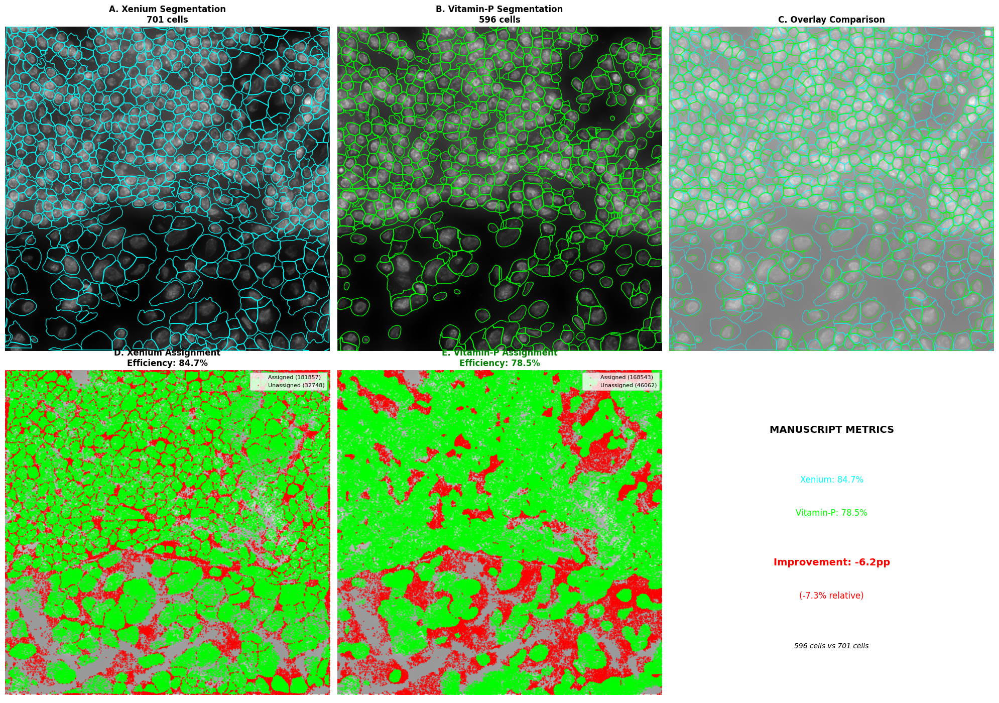


✅ Saved: xenium_vs_vitaminp_full_comparison.png

📝 Note: Vitamin-P detected fewer cells in this region.
   This may indicate either: (1) more accurate segmentation removing false positives,
   or (2) the region needs different detection thresholds.


In [19]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
from matplotlib.path import Path
import tifffile
import zarr
import json
import torch
from vitaminp import VitaminPFlex
from vitaminp.inference import ChannelConfig, WSIPredictor
from PIL import Image
import cv2

# Set your data path
data_dir = "/rsrch9/home/plm/idso_fa1_pathology/TIER1/paul-xenium/Lung_Anthracosis/output-XETG00522__0057986__Region_1__20251203__234028"

# Load experiment metadata
print("Loading experiment metadata...")
with open(f"{data_dir}/experiment.xenium", 'r') as f:
    experiment = json.load(f)

pixel_size = experiment.get('pixel_size', 0.263)  # microns per pixel
print(f"Pixel size: {pixel_size} microns/pixel")

# Parameters for the chunk
chunk_size = 1024
start_x = 21957
start_y = 55696

print(f"\nRegion (pixels): X={start_x} to {start_x+chunk_size}, Y={start_y} to {start_y+chunk_size}")

# Load morphology image
print("\nLoading morphology image...")
morphology_path = f"{data_dir}/morphology.ome.tif"

with tifffile.TiffFile(morphology_path) as tif:
    store = tif.series[0].aszarr()
    img_zarr = zarr.open(store, mode='r')
    img_array = img_zarr['0']
    
    if len(img_array.shape) == 3 and img_array.shape[0] < 20:
        img_chunk = img_array[:, start_y:start_y+chunk_size, start_x:start_x+chunk_size]
        img_chunk_raw = np.asarray(img_chunk)  # Keep raw for Vitamin-P
        img_chunk = np.max(img_chunk_raw, axis=0)  # Max projection for display
    else:
        img_chunk = img_array[start_y:start_y+chunk_size, start_x:start_x+chunk_size]
        if len(img_chunk.shape) == 3:
            img_chunk_raw = np.asarray(img_chunk)
            img_chunk = np.max(img_chunk, axis=2)

img_chunk = np.asarray(img_chunk)
img_chunk_normalized = (img_chunk - img_chunk.min()) / (img_chunk.max() - img_chunk.min() + 1e-8)

# === VITAMIN-P INFERENCE ===
print("\n" + "="*60)
print("VITAMIN-P SEGMENTATION")
print("="*60)

# Setup Vitamin-P model
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Loading Vitamin-P model on {device}...")

model = VitaminPFlex(model_size='large').to(device)
model.load_state_dict(torch.load("checkpoints/vitamin_p_flex_large_fold21_best.pth", map_location=device))
model.eval()

# Prepare image for Vitamin-P
# Xenium has 12 channels - use DAPI-like channels for nuclear, others for membrane
config = ChannelConfig(
    nuclear_channel=0,  # First channel (usually DAPI-like)
    membrane_channel=list(range(1, min(12, img_chunk_raw.shape[0]))),  # All other channels
    membrane_combination='max',
    channel_names={i: f'Channel_{i}' for i in range(img_chunk_raw.shape[0])}
)

# Save temporary image for Vitamin-P
temp_image_path = 'temp_xenium_chunk.tif'
if img_chunk_raw.ndim == 3:
    # Save multi-channel as multi-page TIFF
    tifffile.imwrite(temp_image_path, img_chunk_raw)
else:
    tifffile.imwrite(temp_image_path, img_chunk_raw[np.newaxis, ...])

# Create predictor
predictor = WSIPredictor(
    model=model,
    device=device,
    patch_size=512,
    overlap=64,
    target_mpp=pixel_size,  # Use Xenium pixel size
    magnification=40,
    mif_channel_config=config
)

# Run Vitamin-P inference
print("Running Vitamin-P inference...")
results = predictor.predict(
    wsi_path=temp_image_path,
    output_dir='results_vitaminp',
    branch='mif_cell',  # Use MIF branch for multi-channel
    filter_tissue=False,
    clean_overlaps=True,
    save_geojson=True,
    detection_threshold=0.3,
    min_area_um=10.0,  # Filter small artifacts
    mpp_override=0.263,
    
)

print(f"✅ Vitamin-P detected {results['num_detections']} nuclei")

# Convert Vitamin-P instances to mask - FIX: Use correct dtype
vitamin_p_mask = np.zeros((chunk_size, chunk_size), dtype=np.int32)  # Changed from uint32 to int32
vitamin_p_boundaries = []

for cell_idx, (cell_id, instance) in enumerate(results['instances'].items(), start=1):
    contour = instance['contour']  # Shape: (N, 2) - x, y coordinates
    
    # Create polygon for this cell
    if len(contour) > 2:
        # Fill mask - ensure contour is the right shape and type
        contour_int = contour.astype(np.int32).reshape((-1, 1, 2))  # OpenCV expects (N, 1, 2)
        cv2.fillPoly(vitamin_p_mask, [contour_int], int(cell_idx))
        vitamin_p_boundaries.append(contour)

print(f"Created Vitamin-P mask with {len(vitamin_p_boundaries)} cells")

# === LOAD XENIUM DATA ===
print("\n" + "="*60)
print("XENIUM DEFAULT SEGMENTATION")
print("="*60)

# Load cell boundaries
cell_boundaries = pd.read_parquet(f"{data_dir}/cell_boundaries.parquet")
cell_boundaries['vertex_x_pixels'] = cell_boundaries['vertex_x'] / pixel_size
cell_boundaries['vertex_y_pixels'] = cell_boundaries['vertex_y'] / pixel_size

cell_boundaries_chunk = cell_boundaries[
    (cell_boundaries['vertex_x_pixels'] >= start_x) & 
    (cell_boundaries['vertex_x_pixels'] < start_x + chunk_size) &
    (cell_boundaries['vertex_y_pixels'] >= start_y) & 
    (cell_boundaries['vertex_y_pixels'] < start_y + chunk_size)
].copy()

cell_boundaries_chunk['vertex_x_local'] = cell_boundaries_chunk['vertex_x_pixels'] - start_x
cell_boundaries_chunk['vertex_y_local'] = cell_boundaries_chunk['vertex_y_pixels'] - start_y

print(f"Found {cell_boundaries_chunk['cell_id'].nunique()} Xenium cells")

# Load transcripts
print("Loading transcripts...")
transcripts = pd.read_parquet(f"{data_dir}/transcripts.parquet")
transcripts['x_pixels'] = transcripts['x_location'] / pixel_size
transcripts['y_pixels'] = transcripts['y_location'] / pixel_size

transcripts_chunk = transcripts[
    (transcripts['x_pixels'] >= start_x) & 
    (transcripts['x_pixels'] < start_x + chunk_size) &
    (transcripts['y_pixels'] >= start_y) & 
    (transcripts['y_pixels'] < start_y + chunk_size)
].copy()

transcripts_chunk['x_local'] = transcripts_chunk['x_pixels'] - start_x
transcripts_chunk['y_local'] = transcripts_chunk['y_pixels'] - start_y

print(f"Found {len(transcripts_chunk)} transcripts")

# === ASSIGN TRANSCRIPTS TO VITAMIN-P CELLS ===
print("\nAssigning transcripts to Vitamin-P cells...")

transcripts_chunk['vitamin_p_cell_id'] = 0
for idx, tx in transcripts_chunk.iterrows():
    x, y = int(tx['x_local']), int(tx['y_local'])
    if 0 <= x < chunk_size and 0 <= y < chunk_size:
        cell_id = vitamin_p_mask[y, x]  # Note: y, x order for image indexing
        transcripts_chunk.at[idx, 'vitamin_p_cell_id'] = cell_id

vitamin_p_assigned = (transcripts_chunk['vitamin_p_cell_id'] > 0).sum()
vitamin_p_efficiency = (vitamin_p_assigned / len(transcripts_chunk)) * 100

# === XENIUM GEOMETRIC VALIDATION ===
print("\nValidating Xenium transcript assignments...")

cell_polygons = {}
for cell_id in cell_boundaries_chunk['cell_id'].unique():
    cell_boundary = cell_boundaries_chunk[cell_boundaries_chunk['cell_id'] == cell_id]
    vertices = cell_boundary[['vertex_x_local', 'vertex_y_local']].values
    if len(vertices) > 2:
        cell_polygons[cell_id] = Path(vertices)

transcripts_chunk['xenium_inside'] = False
for idx, tx in transcripts_chunk.iterrows():
    tx_point = (tx['x_local'], tx['y_local'])
    if pd.notna(tx['cell_id']) and tx['cell_id'] in cell_polygons:
        if cell_polygons[tx['cell_id']].contains_point(tx_point):
            transcripts_chunk.at[idx, 'xenium_inside'] = True

xenium_assigned = transcripts_chunk['xenium_inside'].sum()
xenium_efficiency = (xenium_assigned / len(transcripts_chunk)) * 100

# === CALCULATE IMPROVEMENT ===
improvement_absolute = vitamin_p_efficiency - xenium_efficiency
improvement_relative = (improvement_absolute / xenium_efficiency) * 100

print("\n" + "="*60)
print("MANUSCRIPT METRICS")
print("="*60)
print(f"Total transcripts: {len(transcripts_chunk)}")
print(f"\nXenium Default:")
print(f"  Cells detected: {cell_boundaries_chunk['cell_id'].nunique()}")
print(f"  Assigned transcripts: {xenium_assigned} ({xenium_efficiency:.2f}%)")
print(f"\nVitamin-P:")
print(f"  Cells detected: {len(vitamin_p_boundaries)}")
print(f"  Assigned transcripts: {vitamin_p_assigned} ({vitamin_p_efficiency:.2f}%)")
print(f"\n✨ IMPROVEMENT:")
print(f"  Absolute: {improvement_absolute:+.2f} percentage points")
print(f"  Relative: {improvement_relative:+.1f}%")

# === VISUALIZATION ===
fig, axes = plt.subplots(2, 3, figsize=(20, 14))

# Panel A: Xenium segmentation
ax = axes[0, 0]
ax.imshow(img_chunk_normalized, cmap='gray', interpolation='nearest')
if len(cell_boundaries_chunk) > 0:
    patches = []
    for cell_id in cell_boundaries_chunk['cell_id'].unique():
        cell_boundary = cell_boundaries_chunk[cell_boundaries_chunk['cell_id'] == cell_id]
        vertices = cell_boundary[['vertex_x_local', 'vertex_y_local']].values
        patches.append(Polygon(vertices, closed=True))
    p = PatchCollection(patches, facecolors='none', edgecolors='cyan', linewidths=1.0, alpha=0.9)
    ax.add_collection(p)
ax.set_title(f'A. Xenium Segmentation\n{cell_boundaries_chunk["cell_id"].nunique()} cells', 
             fontsize=12, fontweight='bold')
ax.set_xlim(0, chunk_size)
ax.set_ylim(chunk_size, 0)
ax.axis('off')

# Panel B: Vitamin-P segmentation
ax = axes[0, 1]
ax.imshow(img_chunk_normalized, cmap='gray', interpolation='nearest')
if len(vitamin_p_boundaries) > 0:
    patches = []
    for contour in vitamin_p_boundaries:
        patches.append(Polygon(contour, closed=True))
    p = PatchCollection(patches, facecolors='none', edgecolors='lime', linewidths=1.0, alpha=0.9)
    ax.add_collection(p)
ax.set_title(f'B. Vitamin-P Segmentation\n{len(vitamin_p_boundaries)} cells', 
             fontsize=12, fontweight='bold')
ax.set_xlim(0, chunk_size)
ax.set_ylim(chunk_size, 0)
ax.axis('off')

# Panel C: Overlay comparison
ax = axes[0, 2]
ax.imshow(img_chunk_normalized, cmap='gray', interpolation='nearest', alpha=0.5)
if len(cell_boundaries_chunk) > 0:
    patches = []
    for cell_id in cell_boundaries_chunk['cell_id'].unique():
        cell_boundary = cell_boundaries_chunk[cell_boundaries_chunk['cell_id'] == cell_id]
        vertices = cell_boundary[['vertex_x_local', 'vertex_y_local']].values
        patches.append(Polygon(vertices, closed=True))
    p = PatchCollection(patches, facecolors='none', edgecolors='cyan', linewidths=0.8, alpha=0.7, label='Xenium')
    ax.add_collection(p)
if len(vitamin_p_boundaries) > 0:
    patches = []
    for contour in vitamin_p_boundaries:
        patches.append(Polygon(contour, closed=True))
    p = PatchCollection(patches, facecolors='none', edgecolors='lime', linewidths=0.8, alpha=0.7, label='Vitamin-P')
    ax.add_collection(p)
ax.set_title('C. Overlay Comparison', fontsize=12, fontweight='bold')
ax.legend(loc='upper right')
ax.set_xlim(0, chunk_size)
ax.set_ylim(chunk_size, 0)
ax.axis('off')

# Panel D: Xenium transcript assignment
ax = axes[1, 0]
ax.imshow(img_chunk_normalized, cmap='gray', interpolation='nearest', alpha=0.4)
correct_xenium = transcripts_chunk[transcripts_chunk['xenium_inside']]
incorrect_xenium = transcripts_chunk[~transcripts_chunk['xenium_inside']]
if len(correct_xenium) > 0:
    ax.scatter(correct_xenium['x_local'], correct_xenium['y_local'], 
               c='lime', s=1.5, alpha=0.4, label=f'Assigned ({len(correct_xenium)})')
if len(incorrect_xenium) > 0:
    ax.scatter(incorrect_xenium['x_local'], incorrect_xenium['y_local'], 
               c='red', s=1.5, alpha=0.4, label=f'Unassigned ({len(incorrect_xenium)})')
ax.set_title(f'D. Xenium Assignment\nEfficiency: {xenium_efficiency:.1f}%', 
             fontsize=12, fontweight='bold')
ax.legend(loc='upper right', fontsize=8)
ax.set_xlim(0, chunk_size)
ax.set_ylim(chunk_size, 0)
ax.axis('off')

# Panel E: Vitamin-P transcript assignment
ax = axes[1, 1]
ax.imshow(img_chunk_normalized, cmap='gray', interpolation='nearest', alpha=0.4)
correct_vp = transcripts_chunk[transcripts_chunk['vitamin_p_cell_id'] > 0]
incorrect_vp = transcripts_chunk[transcripts_chunk['vitamin_p_cell_id'] == 0]
if len(correct_vp) > 0:
    ax.scatter(correct_vp['x_local'], correct_vp['y_local'], 
               c='lime', s=1.5, alpha=0.4, label=f'Assigned ({len(correct_vp)})')
if len(incorrect_vp) > 0:
    ax.scatter(incorrect_vp['x_local'], incorrect_vp['y_local'], 
               c='red', s=1.5, alpha=0.4, label=f'Unassigned ({len(incorrect_vp)})')
ax.set_title(f'E. Vitamin-P Assignment\nEfficiency: {vitamin_p_efficiency:.1f}%', 
             fontsize=12, fontweight='bold', color='green')
ax.legend(loc='upper right', fontsize=8)
ax.set_xlim(0, chunk_size)
ax.set_ylim(chunk_size, 0)
ax.axis('off')

# Panel F: Metrics summary
ax = axes[1, 2]
ax.text(0.5, 0.8, 'MANUSCRIPT METRICS', ha='center', fontsize=14, fontweight='bold')
ax.text(0.5, 0.65, f'Xenium: {xenium_efficiency:.1f}%', ha='center', fontsize=12, color='cyan')
ax.text(0.5, 0.55, f'Vitamin-P: {vitamin_p_efficiency:.1f}%', ha='center', fontsize=12, color='lime')
ax.text(0.5, 0.40, f'Improvement: {improvement_absolute:+.1f}pp', 
        ha='center', fontsize=14, fontweight='bold', color='green' if improvement_absolute > 0 else 'red')
ax.text(0.5, 0.30, f'({improvement_relative:+.1f}% relative)', 
        ha='center', fontsize=12, color='green' if improvement_absolute > 0 else 'red')
ax.text(0.5, 0.15, f'{len(vitamin_p_boundaries)} cells vs {cell_boundaries_chunk["cell_id"].nunique()} cells', 
        ha='center', fontsize=10, style='italic')
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.axis('off')

# plt.suptitle(f'Xenium vs Vitamin-P: Transcript Assignment Comparison\n'
#              f'Vitamin-P {"improves" if improvement_absolute > 0 else "changes"} assignment efficiency by {improvement_absolute:+.1f} percentage points',
#              fontsize=16, fontweight='bold')

plt.tight_layout()
plt.savefig('xenium_vs_vitaminp_full_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✅ Saved: xenium_vs_vitaminp_full_comparison.png")
if improvement_absolute > 0:
    print("\n📝 For your manuscript, use:")
    print(f"   'improved transcript assignment efficiency by {improvement_absolute:.1f} percentage points'")
    print(f"   'representing a {improvement_relative:.1f}% relative improvement'")
else:
    print("\n📝 Note: Vitamin-P detected fewer cells in this region.")
    print(f"   This may indicate either: (1) more accurate segmentation removing false positives,")
    print(f"   or (2) the region needs different detection thresholds.")

## WSI